# Dada2 pipeline

In [ ]:
# Bioconductor:
if (!requireNamespace("BiocManager", quietly = TRUE))
  install.packages("BiocManager")

In [ ]:
list <- c("dada2","Biostrings","phyloseq","tibble","tidyr","readr","dplyr","ggplot2")
BiocManager::install(list,version = "3.10",update = TRUE, ask=FALSE)

In [6]:
# LOAD PACKAGES REQUIRED FOR DADA2 PIPELINE
library(dada2)
library(dplyr)
library(tidyr)
library(tibble)
library(Biostrings)
library(stringr)

In [67]:
packageVersion("dada2")

[1] '1.14.0'

In [23]:
# Setting the working directory to the currect directory
setwd <-  getwd()

In [30]:
# LIST THE FILES IN YOUR PATH
path <- "C:\\Users\\SA04PA\\SAMS\\Project Collaboration - GlobalSeaweedSTAR\\WorkPackagesFiles\\Shared\\Bioinformatics Workshop Malaysia 2020\\DATA\\SENTINEL_FARM_DATA"
length(list.files(path)) # prints a list of all the fastq files to the console - should be 58 in total (29 libraries)

[1] 58

In [31]:
# CREATE LIST OF FORWARD READ FILES
fnFs <- sort(list.files(path, pattern="val_1.fq.gz", full.names = TRUE))
# CREATE LIST OF REVERSE READ FILES
fnRs <- sort(list.files(path, pattern="val_2.fq.gz", full.names = TRUE))

length(fnFs) # should be 29 - one for each sample
length(fnRs) # should be 29 - one for each sample

[1] 29

[1] 29

In [36]:
head(fnFs,2)

[1] "C:\\Users\\SA04PA\\SAMS\\Project Collaboration - GlobalSeaweedSTAR\\WorkPackagesFiles\\Shared\\Bioinformatics Workshop Malaysia 2020\\DATA\\SENTINEL_FARM_DATA/16S-GSS226-026-A-D_S16_L001_R1_001_val_1.fq.gz"
[2] "C:\\Users\\SA04PA\\SAMS\\Project Collaboration - GlobalSeaweedSTAR\\WorkPackagesFiles\\Shared\\Bioinformatics Workshop Malaysia 2020\\DATA\\SENTINEL_FARM_DATA/16S-GSS226-026-BF_S6_L001_R1_001_val_1.fq.gz"

In [33]:
# CREATE A LIST OF SAMPLE NAMES FROM YOUR FORWARD READ FILES
sample.names <- sapply(strsplit(basename(fnFs),"_"), `[`,1) # uses all characters up to the first underscore as the sample name
sample.names

[1] "16S-GSS226-026-A-D"    "16S-GSS226-026-BF"     "16S-GSS226-026-S-D"   
 [4] "16S-GSS226-030-A-D"    "16S-GSS226-030-BF"     "16S-GSS226-030-S-D"   
 [7] "16S-GSS226-042-A-D"    "16S-GSS226-042-P-BF"   "16S-GSS226-042-P-D"   
[10] "16S-GSS226-042-S-BF"   "16S-GSS226-042-S-D"    "16S-GSS226-043-S-BF"  
[13] "16S-GSS226-043-S-D"    "16S-GSS226-113-P-BFEP" "16S-GSS226-113-P-D"   
[16] "16S-GSS226-115-P-BF"   "16S-GSS226-115-P-D"    "16S-GSS226-116-P-BFEP"
[19] "16S-GSS226-116-P-D"    "16S-GSS226-160-P-BF"   "16S-GSS226-160-P-D"   
[22] "16S-GSS226-160-S-BF"   "16S-GSS226-160-S-D"    "16S-GSS226-161-P-D"   
[25] "16S-GSS226-FT09-WAT"   "16S-GSS226-FT18-WAT"   "16S-GSS226-FT27-WAT"  
[28] "16S-GSS226-FT36-WAT"   "16S-GSS226-negative"

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.


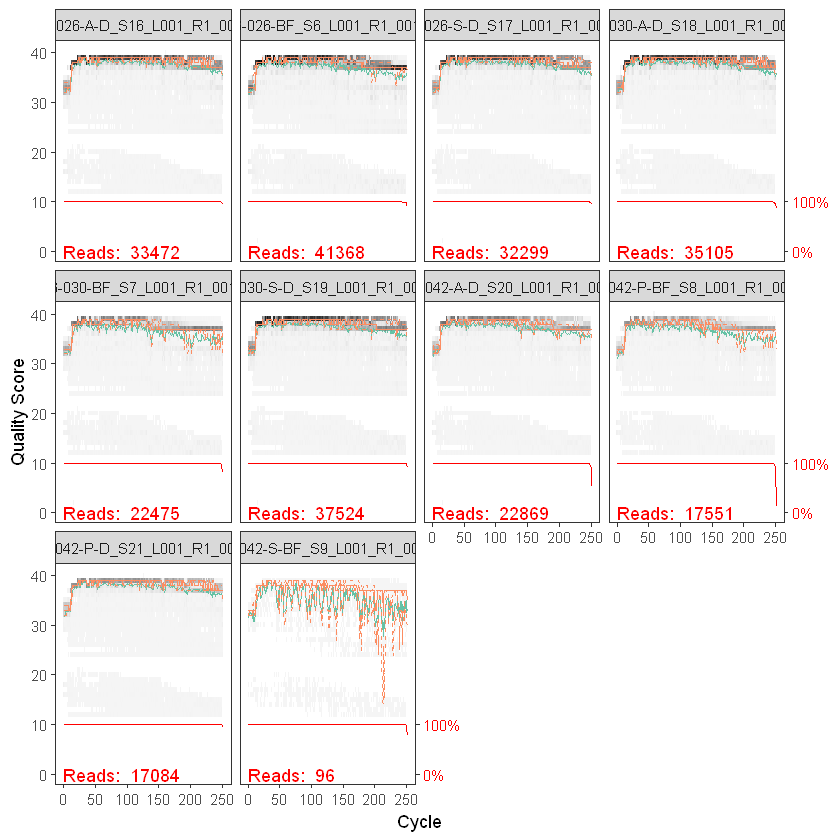

In [45]:
# PLOT THE QUALITY OF YOUR FORWARD READS
plotQualityProfile(fnFs[1:10]) # takes a few seconds, then plots will appear in the bottom right corner
# green = mean quality score
# orange = quartiles of score distribution
# red = scaled proportion of reads extending to that position

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.


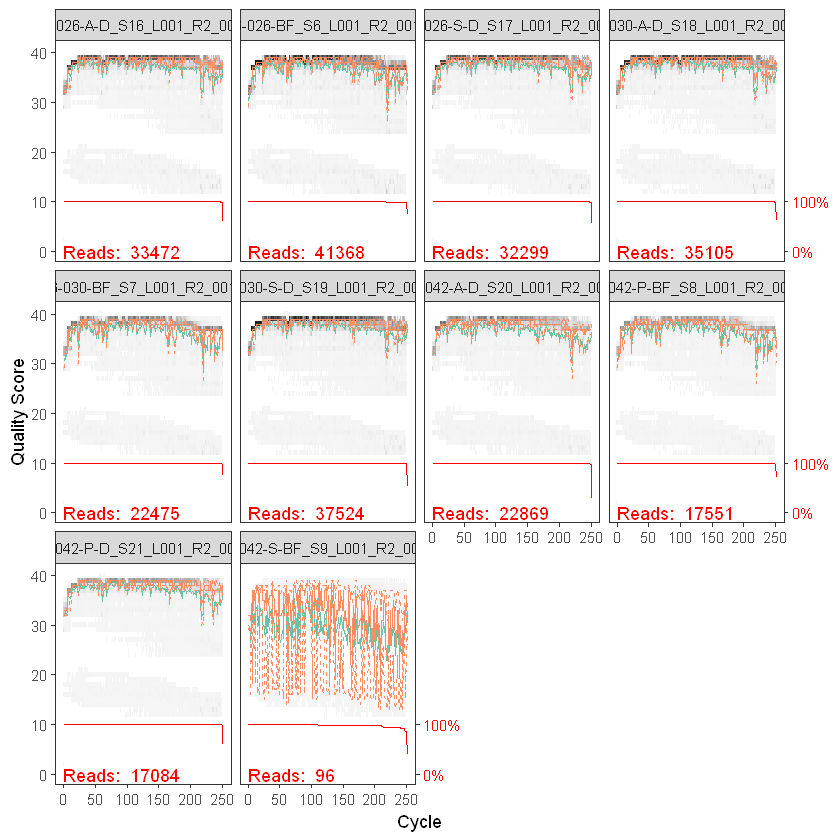

In [46]:
# PLOT THE QUALITY OF YOUR REVERSE READS
plotQualityProfile(fnRs[1:10])

In [47]:
# CREATE A SUBDIRECTORY AND NAMING SYSTEM FOR YOUR FILTERED READS
filtFs <- file.path(setwd, "filtered", # creates a path to folder named "filtered" in the folder you set as your path
                    paste0(sample.names, "_F_filt.fastq.gz")) # filtered read names will be sample name + _F_filt.fastq.gz. These names are in a list called filtFs

filtRs <- file.path(setwd, "filtered", paste0(sample.names, "_R_filt.fastq.gz"))

names(filtFs)<- sample.names
names(filtRs) <- sample.names

In [52]:
# FILTER AND TRIM YOUR READS

out <- filterAndTrim(fnFs, filtFs, fnRs, filtRs,
                     truncLen = c(230, 200), # truncate F reads to 230nt and reverse to 200 - choose these values based on your quality plots!
                     maxN=0, # removes all ambiguous basecalls
                     maxEE=c(2,2), # maximum expected errors. If you have lower quality data, consider increasing these values to help more reads pass filter
                     truncQ = 2, # truncate reads at the first nucleotide with a value of 2 or below
                     rm.phix=TRUE, # removes all reads which match against the PhiX genome (make sure to use this, as your run WILL have used PhiX!)
                     compress=TRUE, # gzips output files (filtered reads)
                     verbose=TRUE) # outputs status messages into the console window below
out

,reads.in,reads.out
16S-GSS226-026-A-D_S16_L001_R1_001_val_1.fq.gz,33472,32552
16S-GSS226-026-BF_S6_L001_R1_001_val_1.fq.gz,41368,39521
16S-GSS226-026-S-D_S17_L001_R1_001_val_1.fq.gz,32299,31313
16S-GSS226-030-A-D_S18_L001_R1_001_val_1.fq.gz,35105,34165
16S-GSS226-030-BF_S7_L001_R1_001_val_1.fq.gz,22475,21271
16S-GSS226-030-S-D_S19_L001_R1_001_val_1.fq.gz,37524,36348
16S-GSS226-042-A-D_S20_L001_R1_001_val_1.fq.gz,22869,21947
16S-GSS226-042-P-BF_S8_L001_R1_001_val_1.fq.gz,17551,16709
16S-GSS226-042-P-D_S21_L001_R1_001_val_1.fq.gz,17084,16569
16S-GSS226-042-S-BF_S9_L001_R1_001_val_1.fq.gz,96,61


# LEARNING ERROR RATES

In [53]:
# Forward reads
errF <- learnErrors(filtFs, multithread = TRUE)
# Reverse reads
errR <- learnErrors(filtRs, multithread = TRUE)

100369240 total bases in 436388 reads from 17 samples will be used for learning the error rates.
100840000 total bases in 504200 reads from 21 samples will be used for learning the error rates.


# VISUALISE ERROR RATES
* Red line = expected error rates under nominal definition of the Q-score
* Black line = estimated error rates
* Black points = observed error rates

Warning message:
"Transformation introduced infinite values in continuous y-axis"Warning message:
"Transformation introduced infinite values in continuous y-axis"

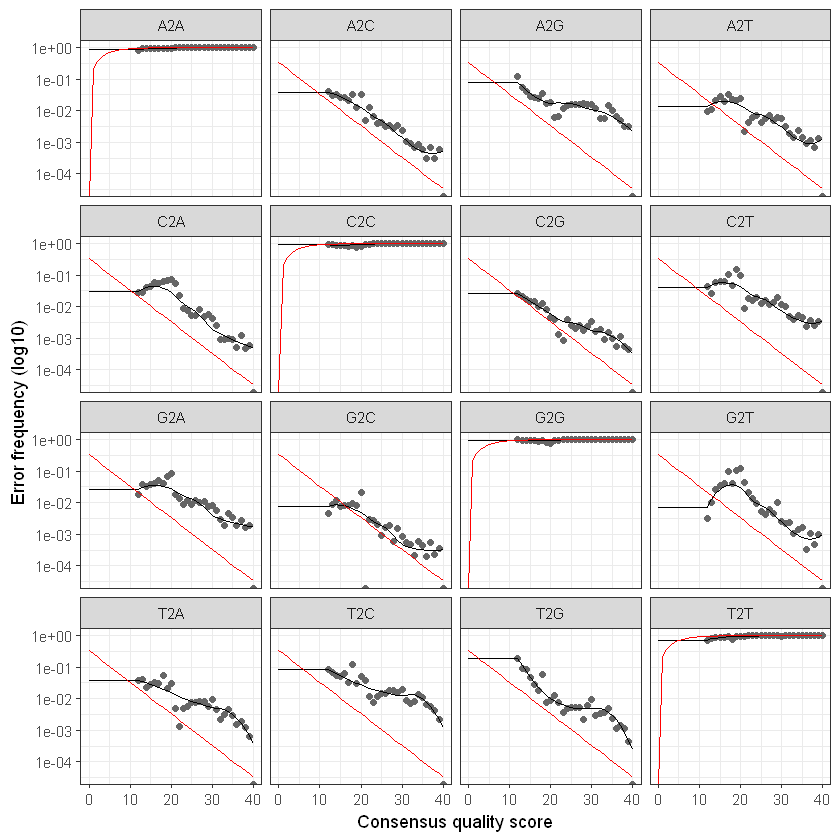

In [55]:
plotErrors(errF, nominalQ = TRUE)

Warning message:
"Transformation introduced infinite values in continuous y-axis"Warning message:
"Transformation introduced infinite values in continuous y-axis"

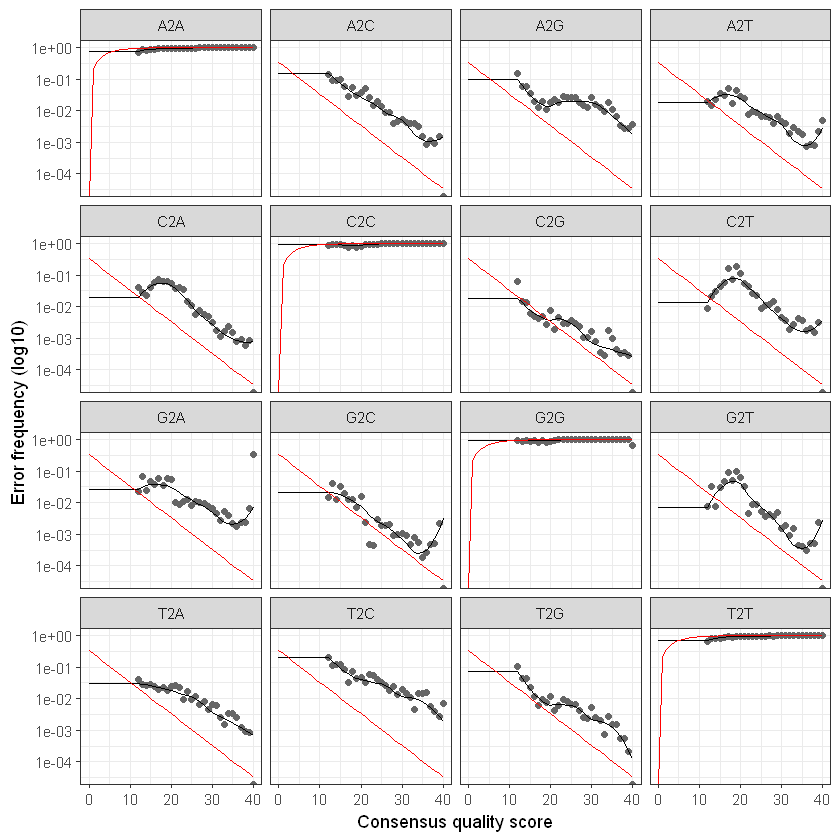

In [56]:
plotErrors(errR, nominalQ = TRUE)

In [57]:
# SAMPLE INFERENCE
dadaFs <- dada(filtFs, err=errF, multithread = TRUE)
dadaRs <- dada(filtRs, err=errR, multithread = TRUE)

Sample 1 - 32552 reads in 4820 unique sequences.
Sample 2 - 39521 reads in 7990 unique sequences.
Sample 3 - 31313 reads in 4374 unique sequences.
Sample 4 - 34165 reads in 5307 unique sequences.
Sample 5 - 21271 reads in 7029 unique sequences.
Sample 6 - 36348 reads in 7000 unique sequences.
Sample 7 - 21947 reads in 5755 unique sequences.
Sample 8 - 16709 reads in 6657 unique sequences.
Sample 9 - 16569 reads in 3527 unique sequences.
Sample 10 - 61 reads in 52 unique sequences.
Sample 11 - 41159 reads in 8065 unique sequences.
Sample 12 - 25462 reads in 9719 unique sequences.
Sample 13 - 32607 reads in 5000 unique sequences.
Sample 14 - 17938 reads in 5612 unique sequences.
Sample 15 - 34203 reads in 11371 unique sequences.
Sample 16 - 5 reads in 3 unique sequences.
Sample 17 - 34558 reads in 13699 unique sequences.
Sample 18 - 29954 reads in 6030 unique sequences.
Sample 19 - 18375 reads in 5865 unique sequences.
Sample 20 - 1225 reads in 646 unique sequences.
Sample 21 - 18258 rea

In [58]:
# MERGE READS
merged <- mergePairs(dadaFs, filtFs, dadaRs, filtRs, verbose = TRUE)

32415 paired-reads (in 31 unique pairings) successfully merged out of 32458 (in 45 pairings) input.
37580 paired-reads (in 367 unique pairings) successfully merged out of 38447 (in 608 pairings) input.
31144 paired-reads (in 44 unique pairings) successfully merged out of 31175 (in 58 pairings) input.
33865 paired-reads (in 70 unique pairings) successfully merged out of 33954 (in 95 pairings) input.
19750 paired-reads (in 195 unique pairings) successfully merged out of 20445 (in 400 pairings) input.
35573 paired-reads (in 118 unique pairings) successfully merged out of 35893 (in 198 pairings) input.
21382 paired-reads (in 94 unique pairings) successfully merged out of 21674 (in 210 pairings) input.
14867 paired-reads (in 256 unique pairings) successfully merged out of 15646 (in 464 pairings) input.
16256 paired-reads (in 88 unique pairings) successfully merged out of 16395 (in 125 pairings) input.
12 paired-reads (in 1 unique pairings) successfully merged out of 12 (in 1 pairings) input

In [59]:
# CONSTRUCT YOUR SEQUENCE TABLE
seqtab <- makeSequenceTable(merged)
dim(seqtab) # tells you the number of samples and total number of number of ASVs

[1]   29 3624

In [60]:
# View the distribution of sequence lengths
table(nchar(getSequences(seqtab))) # outputs to the console the distribution of sequence lengths 
# Lengths should all be around the same size (240-260; anything much larger than this is likely to be misaligned or misprimed amplification)


 230  232  234  241  244  246  247  248  249  250  251  252  253  254  255  256 
   5    1    1    1    1    2    2    3    3    8   15  126 3220  137   21   18 
 257  258  259  260  262  263  264  265  266  269  317  331  334  340  343  345 
   4    5    3    4    2    4    1    1    1    1    1    1    1    1    1    1 
 350  364  369  370  372  376  379  392  398  404  406  409  410  415  416  417 
   1    1    1    2    2    4    1    1    1    1    1    1    1    2    2    3 
 418 
   3 

In [61]:
# Remove long sequences and create a new sequence table 

seqtab_short <- seqtab[,nchar(colnames(seqtab)) %in% 230:300]
dim(seqtab_short) # can check how many ASVs have been removed

seqtab.nochim <- removeBimeraDenovo(seqtab_short, method = "consensus", multithread = TRUE, verbose = TRUE) # outputs number of sequences identified as bimeric
# the number of identified bimeras can be quite high in some datasets but don't panic - these are likely low abundance sequence variants and therefore only a tiny proportion of your data
dim(seqtab.nochim)

[1]   29 3590

Identified 232 bimeras out of 3590 input sequences.


[1]   29 3358

In [63]:
# CREATE A SUMMARY TABLE TO TRACK READ NUMBERS THROUGH THE PIPELINE

getN <- function(x) sum(getUniques(x))
track <- cbind(out, sapply(dadaFs, getN), sapply(dadaRs, getN), sapply(merged, getN), rowSums(seqtab.nochim))
colnames(track) <- c("input", "filtered", "denoisedF", "denoisedR", "merged", "nonchim")
rownames(track) <- sample.names
head(track)

,input,filtered,denoisedF,denoisedR,merged,nonchim
16S-GSS226-026-A-D,33472,32552,32471,32487,32415,32329
16S-GSS226-026-BF,41368,39521,38717,38838,37580,36864
16S-GSS226-026-S-D,32299,31313,31193,31223,31144,31051
16S-GSS226-030-A-D,35105,34165,33999,34014,33865,33865
16S-GSS226-030-BF,22475,21271,20722,20658,19750,18620
16S-GSS226-030-S-D,37524,36348,36005,36076,35573,35247


# ASSIGN TAXONOMY

In [66]:
data_path <-"C:\\Users\\SA04PA\\SAMS\\Project Collaboration - GlobalSeaweedSTAR\\WorkPackagesFiles\\Shared\\Bioinformatics Workshop Malaysia 2020\\SCRIPTS\\silva_nr_v132_train_set.fa.gz"
taxa <- assignTaxonomy(seqtab.nochim, # input sequence table
                       data_path, # reference database - this file needs to be in your working directory!!
                       outputBootstraps = TRUE,
                       multithread = TRUE,
                       verbose = TRUE)
taxa

Finished processing reference fasta.

,Kingdom,Phylum,Class,Order,Family,Genus
AACGGGAAGGGTTGACGTTATTCGAATTTATTGGGCGTAAAGCATATTTAGGTGGAAAGCTTTATTTTTACTTAAATTTCAGATCTAATTTCTGAGTTTCTTTAATCAAAGTCTTCTAGAGTTTAGTTGAAGGTTATGGAACTTTAAGTGTAACGGTAAAATGTTCTAATACTTAAAAGAACCTCAATAGCGTAAGCAATAGCCTAAGCTAATACTGACATTACGATATTAAAGTGTGGGTAGCAAAAGGG,Bacteria,Proteobacteria,Alphaproteobacteria,Rickettsiales,Mitochondria,NA
TACGGGGGATGCAAGCGTTATCCGGAATTATTGGGCGTAAAGCGTCTGTAGGTGGCTCAGTAAGTCTGCTGTTAAATATTGGGGCTCAACCCTAAGCAAGCAGTGGAAACTACTAAGCTAGAGTACGGTATGGGTAGAGGGAATTCCCAGTGTAGCGGTGAAATGCGTAGATATTGGGAAGAACACCAGAAGCGAAGGCGCTCTACTTGGCCTTTACTGACACTCAGAGACGAAAGCTAAGGTAGCGAATGGG,Bacteria,Cyanobacteria,Oxyphotobacteria,Chloroplast,NA,NA
TACGGAGGGTGCGAGCGTTAATCGGAATTACTGGGCGTAAAGCGCATGCAGGTGGTTTGTTAAGTCAGATGTGAAAGCCCGGGGCTCAACCTCGGAATAGCATTTGAAACTGGCAGACTAGAGTACTGTAGAGGGGGGTAGAATTTCAGGTGTAGCGGTGAAATGCGTAGAGATCTGAAGGAATACCGGTGGCGAAGGCGGCCCCCTGGACAGATACTGACACTCAGATGCGAAAGCGTGGGGAGCAAACAGG,Bacteria,Proteobacteria,Gammaproteobacteria,Vibrionales,Vibrionaceae,Catenococcus
TACGGAGGGTGCGAGCGTTAATCGGAATTACTGGGCGTAAAGCGCATGCAGGTGGTTTGTTAAGTCAGATGTGAAAGCCCGGGGCTCAACCTCGGAATTGCATTTGAAACTGGCAGACTAGAGTACTGTAGAGGGGGGTAGAATTTCAGGTGTAGCGGTGAAATGCGTAGAGATCTGAAGGAATACCGGTGGCGAAGGCGGCCCCCTGGACAGATACTGACACTCAGATGCGAAAGCGTGGGGAGCAAACAGG,Bacteria,Proteobacteria,Gammaproteobacteria,Vibrionales,Vibrionaceae,Vibrio
TACGGAGGGTGCGAGCGTTAATCGGAATTACTGGGCGTAAAGCGCATGCAGGTGGTTTGTTAAGTCAGATGTGAAAGCCCGGGGCTCAACCTCGGAACTGCATTTGAAACTGGCAAACTAGAGTACTGTAGAGGGGGGTAGAATTTCAGGTGTAGCGGTGAAATGCGTAGAGATCTGAAGGAATACCAGTGGCGAAGGCGGCCCCCTGGACAGATACTGACACTCAGATGCGAAAGCGTGGGGAGCAAACAGG,Bacteria,Proteobacteria,Gammaproteobacteria,Vibrionales,Vibrionaceae,Vibrio
TACGGGAGTGGCAAGCGTTATCCGGAATTATTGGGCGTAAAGCGTCCGCAGGCGGCCCTTCAAGTCTGCTGTTAAAAAGTGGAGCTTAACTCCATCATGGCAGTGGAAACTGTTGGGCTTGAGTGTGGTAGGGGCAGAGGGAATTCCCGGTGTAGCGGTGAAATGCGTAGATATCGGGAAGAACACCAGTGGCGAAGGCGCTCTGCTGGGCCATCACTGACGCTCATGGACGAAAGCCAGGGGAGCGAAAGGG,Bacteria,Cyanobacteria,Oxyphotobacteria,Synechococcales,Cyanobiaceae,Synechococcus_CC9902
TACGGAGGGTGCGAGCGTTAATCGGAATTACTGGGCGTAAAGCGCACGCAGGCGGTTTGTTAAGCTAGATGTGAAAGCCCCGGGCTCAACCTGGGATGGTCATTTAGAACTGGCAGACTAGAGTCTTGGAGAGGGGAGTGGAATTCCAGGTGTAGCGGTGAAATGCGTAGATATCTGGAGGAACATCAGTGGCGAAGGCGACTCCCTGGCCAAAGACTGACGCTCATGTGCGAAAGTGTGGGTAGCGAACAGG,Bacteria,Proteobacteria,Gammaproteobacteria,Alteromonadales,Alteromonadaceae,Alteromonas
GACGGAGGATGCAAGTGTTATCCGGAATCACTGGGCGTAAAGCGTCTGTAGGTGGTCAAATAAGTCAACTGTTAAATCTTGAGGCTCAACCTCAAAATCGCAGTCGAAACTATTAGACTCGAGTATAGTAGAGGTAAAGGGAATTTCCAGTGGAGCGGTGAAATGCGTAGAGATTGGAAAGAACACCGATGGCGAAGGCACTTTACTGGGCTATTACTGACACTCAGAGACGAAAGCTAGGGTAGCAAATGGG,Bacteria,Cyanobacteria,Oxyphotobacteria,Chloroplast,NA,NA
TACGGGAGTGGCAAGCGTTATCCGGAATTATTGGGCGTAAAGCGTCCGCAGGCGGTCTGTCAAGTCTGCTGTTAAAGCGTGGAGCTTAACTCCATTTCGGCAGTGGAAACTGACAGACTAGAGTGTGGTAGGGGCAGAGGGAATTCCCGGTGTAGCGGTGAAATGCGTAGATATCGGGAAGAACACCAGTGGCGAAGGCGCTCTGCTGGGCCATAACTGACGCTCATGGACGAAAGCCAGGGGAGCGAAAGGG,Bacteria,Cyanobacteria,Oxyphotobacteria,Synechococcales,Cyanobiaceae,Cyanobium_PCC-6307
TACGGAGGGGGTTAGCGTTGTTCGGAATTACTGGGCGTAAAGCGCGCGTAGGCGGATTAGAAAGTTGGGGGTGAAATCCCGGGGCTCAACCTCGGAACTGCCTCCAAAACTGCTAGTCTAGAGTTCGAGAGAGGTGAGTGGAATTCCGAGTGTAGAGGTGAAATTCGTAGATATTCGGAGGAACACCAGTGGCGAAGGCGGCTCACTGGCTCGATACTGACGCTGAGGTGCGAAAGTGTGGGGAGCAAACAGG,Bacteria,Proteobacteria,Alphaproteobacteria,Rhodobacterales,Rhodobacteraceae,HIMB11


# Rename ASVs

In [ ]:
seqtab.nochim_trans <- as.data.frame(t(seqtab.nochim)) %>% rownames_to_column(var = "sequence") %>% 
  rowid_to_column(var = "OTUNumber") %>% mutate(OTUNumber=sprintf("otu%04d", OTUNumber)) %>% mutate(sequence = str_replace_all(sequence, "(-|\\.)",""))
df <- seqtab.nochim_trans
seq_out <- Biostrings::DNAStringSet(df$sequence)
names(seq_out) <- df$OTUNumber
Biostrings::writeXStringSet(seq_out, str_c("output/ASVs.fasta"), compress = FALSE, width=20000)

In [70]:
head(seqtab.nochim_trans)

OTUNumber,sequence,16S-GSS226-026-A-D,16S-GSS226-026-BF,16S-GSS226-026-S-D,16S-GSS226-030-A-D,16S-GSS226-030-BF,16S-GSS226-030-S-D,16S-GSS226-042-A-D,16S-GSS226-042-P-BF,...,16S-GSS226-160-P-BF,16S-GSS226-160-P-D,16S-GSS226-160-S-BF,16S-GSS226-160-S-D,16S-GSS226-161-P-D,16S-GSS226-FT09-WAT,16S-GSS226-FT18-WAT,16S-GSS226-FT27-WAT,16S-GSS226-FT36-WAT,16S-GSS226-negative
otu0001,AACGGGAAGGGTTGACGTTATTCGAATTTATTGGGCGTAAAGCATATTTAGGTGGAAAGCTTTATTTTTACTTAAATTTCAGATCTAATTTCTGAGTTTCTTTAATCAAAGTCTTCTAGAGTTTAGTTGAAGGTTATGGAACTTTAAGTGTAACGGTAAAATGTTCTAATACTTAAAAGAACCTCAATAGCGTAAGCAATAGCCTAAGCTAATACTGACATTACGATATTAAAGTGTGGGTAGCAAAAGGG,19543,1614,17447,21642,121,19093,5881,14,...,0,11751,0,7027,13466,20,0,7,5,0
otu0002,TACGGGGGATGCAAGCGTTATCCGGAATTATTGGGCGTAAAGCGTCTGTAGGTGGCTCAGTAAGTCTGCTGTTAAATATTGGGGCTCAACCCTAAGCAAGCAGTGGAAACTACTAAGCTAGAGTACGGTATGGGTAGAGGGAATTCCCAGTGTAGCGGTGAAATGCGTAGATATTGGGAAGAACACCAGAAGCGAAGGCGCTCTACTTGGCCTTTACTGACACTCAGAGACGAAAGCTAAGGTAGCGAATGGG,9161,1161,11735,10598,48,6599,2582,8,...,0,3953,0,2686,4345,0,16,0,0,0
otu0003,TACGGAGGGTGCGAGCGTTAATCGGAATTACTGGGCGTAAAGCGCATGCAGGTGGTTTGTTAAGTCAGATGTGAAAGCCCGGGGCTCAACCTCGGAATAGCATTTGAAACTGGCAGACTAGAGTACTGTAGAGGGGGGTAGAATTTCAGGTGTAGCGGTGAAATGCGTAGAGATCTGAAGGAATACCGGTGGCGAAGGCGGCCCCCTGGACAGATACTGACACTCAGATGCGAAAGCGTGGGGAGCAAACAGG,0,1389,0,124,1900,865,2957,1290,...,0,0,808,0,0,0,0,48,177,0
otu0004,TACGGAGGGTGCGAGCGTTAATCGGAATTACTGGGCGTAAAGCGCATGCAGGTGGTTTGTTAAGTCAGATGTGAAAGCCCGGGGCTCAACCTCGGAATTGCATTTGAAACTGGCAGACTAGAGTACTGTAGAGGGGGGTAGAATTTCAGGTGTAGCGGTGAAATGCGTAGAGATCTGAAGGAATACCGGTGGCGAAGGCGGCCCCCTGGACAGATACTGACACTCAGATGCGAAAGCGTGGGGAGCAAACAGG,0,285,0,71,897,689,609,1806,...,82,823,825,0,0,39,0,151,193,0
otu0005,TACGGAGGGTGCGAGCGTTAATCGGAATTACTGGGCGTAAAGCGCATGCAGGTGGTTTGTTAAGTCAGATGTGAAAGCCCGGGGCTCAACCTCGGAACTGCATTTGAAACTGGCAAACTAGAGTACTGTAGAGGGGGGTAGAATTTCAGGTGTAGCGGTGAAATGCGTAGAGATCTGAAGGAATACCAGTGGCGAAGGCGGCCCCCTGGACAGATACTGACACTCAGATGCGAAAGCGTGGGGAGCAAACAGG,59,5303,47,215,3578,1403,922,317,...,0,0,111,0,0,0,0,0,71,0
otu0006,TACGGGAGTGGCAAGCGTTATCCGGAATTATTGGGCGTAAAGCGTCCGCAGGCGGCCCTTCAAGTCTGCTGTTAAAAAGTGGAGCTTAACTCCATCATGGCAGTGGAAACTGTTGGGCTTGAGTGTGGTAGGGGCAGAGGGAATTCCCGGTGTAGCGGTGAAATGCGTAGATATCGGGAAGAACACCAGTGGCGAAGGCGCTCTGCTGGGCCATCACTGACGCTCATGGACGAAAGCCAGGGGAGCGAAAGGG,2,18,0,5,18,16,4,16,...,0,0,106,0,0,4672,3506,1199,3149,0


# Append taxonomy and bootstraps to your sequence table

In [71]:
taxa_tax <- as.data.frame(taxa$tax)
taxa_boot <- as.data.frame(taxa$boot) %>% rename_all(funs(str_c(., "_boot"))) # this will give you an error message, but you can ignore it!
seqtab.nochim_trans <- taxa_tax %>% bind_cols(taxa_boot) %>% bind_cols(seqtab.nochim_trans)

Warning message:
"funs() is soft deprecated as of dplyr 0.8.0
Please use a list of either functions or lambdas: 

  # Simple named list: 
  list(mean = mean, median = median)

  # Auto named with `tibble::lst()`: 
  tibble::lst(mean, median)

  # Using lambdas
  list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))
This warning is displayed once per session."

In [73]:
head(seqtab.nochim_trans)

Kingdom,Phylum,Class,Order,Family,Genus,Kingdom_boot,Phylum_boot,Class_boot,Order_boot,...,16S-GSS226-160-P-BF,16S-GSS226-160-P-D,16S-GSS226-160-S-BF,16S-GSS226-160-S-D,16S-GSS226-161-P-D,16S-GSS226-FT09-WAT,16S-GSS226-FT18-WAT,16S-GSS226-FT27-WAT,16S-GSS226-FT36-WAT,16S-GSS226-negative
Bacteria,Proteobacteria,Alphaproteobacteria,Rickettsiales,Mitochondria,NA,92,92,91,91,...,0,11751,0,7027,13466,20,0,7,5,0
Bacteria,Cyanobacteria,Oxyphotobacteria,Chloroplast,NA,NA,100,100,100,55,...,0,3953,0,2686,4345,0,16,0,0,0
Bacteria,Proteobacteria,Gammaproteobacteria,Vibrionales,Vibrionaceae,Catenococcus,100,100,100,100,...,0,0,808,0,0,0,0,48,177,0
Bacteria,Proteobacteria,Gammaproteobacteria,Vibrionales,Vibrionaceae,Vibrio,100,100,100,100,...,82,823,825,0,0,39,0,151,193,0
Bacteria,Proteobacteria,Gammaproteobacteria,Vibrionales,Vibrionaceae,Vibrio,100,100,100,100,...,0,0,111,0,0,0,0,0,71,0
Bacteria,Cyanobacteria,Oxyphotobacteria,Synechococcales,Cyanobiaceae,Synechococcus_CC9902,100,100,100,100,...,0,0,106,0,0,4672,3506,1199,3149,0


# SAVE YOUR SEQUENCE TABLE AND TAXONOMIC ASSIGNMENTS

In [75]:
saveRDS(seqtab.nochim_trans, "output/appended_sequence_table.rds") # saves your sequence table as an R object names "sequence_table.rds" in your working directory
saveRDS(taxa, "output/taxonomic_assignment_bootstrap.rds") # saves your taxa table as an R object named "taxonomic_assignment_bootstrap.rds" in your working directory
saveRDS(seqtab.nochim, "output/sequence_table.rds")
# both of these can be read back into R in a new session using the following commands to continue analysing your data:
# taxa <-readRDS("taxonomic_assignment_bootstrap.rds")
# seqtab.nochim <- readRDS("sequence_table.rds")

# Create .csv versions of your appended sequence table to examine in Excel:
write.csv(seqtab.nochim_trans, "output/appended_sequence_table.csv")